# Object Detection API Demo

<table align="left"><td>
  <a target="_blank"  href="https://colab.sandbox.google.com/github/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

Welcome to the [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection). This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image.

> **Important**: This tutorial is to help you through the first step towards using [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection) to build models. If you just just need an off the shelf model that does the job, see the [TFHub object detection example](https://colab.sandbox.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb).

# Setup

Important: If you're running on a local machine, be sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/installation.md). This notebook includes only what's necessary to run in Colab.

### Install

In [1]:
!pip install -U --pre tensorflow=="2.*"
#!pip install tf_slim

Requirement already up-to-date: tensorflow==2.* in /home/user/anaconda3/envs/tensorflow/lib/python3.8/site-packages (2.3.1)
  Using cached numpy-1.18.5-cp38-cp38-manylinux1_x86_64.whl (20.6 MB)
ERROR: Error while checking for conflicts. Please file an issue on pip's issue tracker: https://github.com/pypa/pip/issues/new
Traceback (most recent call last):
  File "/home/user/anaconda3/envs/tensorflow/lib/python3.8/site-packages/pip/_vendor/pkg_resources/__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "/home/user/anaconda3/envs/tensorflow/lib/python3.8/site-packages/pip/_vendor/pkg_resources/__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/user/anaconda3/envs/tensorflow/lib/python3.8/site-packages/pip/_vendor/pkg_resources/__init__.py", line 3012, in _parsed_pkg_info
    return self.

Make sure you have `pycocotools` installed

In [2]:
#!pip install pycocotools

Get `tensorflow/models` or `cd` to parent directory of the repository.

In [2]:
import os
import pathlib


#if "models" in pathlib.Path.cwd().parts:
#  while "models" in pathlib.Path.cwd().parts:
#    os.chdir('..')
#elif not pathlib.Path('models').exists():
#  !git clone --depth 1 https://github.com/tensorflow/models

Compile protobufs and install the object_detection package

In [3]:
#%%bash
#cd models/research/
#protoc object_detection/protos/*.proto --python_out=.###

In [4]:
#%%bash 
#cd models/research
#pip install .

### Imports

In [5]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import os
import pathlib
import imutils


from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

Import the object detection module.

In [6]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Patches:

In [7]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing the path.

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

## Loader

In [8]:
#def load_model(model_name):
#  base_url = 'http://download.tensorflow.org/models/object_detection/'
#  model_file = model_name + '.tar.gz'
#  model_dir = tf.keras.utils.get_file(
#    fname=model_name, 
#    origin=base_url + model_file,
#    untar=True)
#   model_dir = pathlib.Path(model_dir)/"saved_model"
#    model_dir = "/home/user/TensorFlow/workspace/training_AS/exported-models/my_model/saved_model"
#    model = tf.saved_model.load(str(model_dir))
    
#    return model

#loaded_model = None

#def load_model(model_dir):
#    global loaded_model
    # load_model
#    model = tf.saved_model.load(str(model_dir))
#    return model

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [9]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = '/home/user/TensorFlow/workspace/training_AS/annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
category_index

{1: {'id': 1, 'name': 'negative'}, 2: {'id': 2, 'name': 'positive'}}

For the sake of simplicity we will test on 2 images:

In [10]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/home/user/TensorFlow/workspace/training_AS/images/test/')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

TEST_IMAGE_PATHS

[PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10000351_1_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10030968_128_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10030968_129_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10045475_184_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10067364_284_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10100564_410_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10104656_70_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10112678_451_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10118897_73_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10119733_74_0.jpg'),
 PosixPath('/home/user/TensorFlow/workspace/training_AS/images/test/10152619_560_0.jpg'),
 PosixPath('/ho

# Detection

Load an object detection model:

In [11]:
#model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
model_dir = "/home/user/TensorFlow/workspace/training_AS/exported-models/my_model_200925/saved_model"
detection_model = tf.saved_model.load(str(model_dir))


Check the model's input signature, it expects a batch of 3-color images of type uint8:

In [14]:
detection_model.signatures["serving_default"].inputs

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>,
 <tf.Tensor 'unknown:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_0:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_1:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_2:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_3:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_4:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_5:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_6:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_7:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_8:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_9:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_10:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_11:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_12:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_13:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_14:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_15:0' shape=() dtype=resource>,
 <tf.Tensor 'unknown_16:0' shape=() dtype=re

And returns several outputs:

In [15]:
detection_model.signatures['serving_default'].output_dtypes

{'raw_detection_scores': tf.float32,
 'detection_anchor_indices': tf.float32,
 'detection_multiclass_scores': tf.float32,
 'raw_detection_boxes': tf.float32,
 'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [16]:
detection_model.signatures['serving_default'].output_shapes

{'raw_detection_scores': TensorShape([1, 196416, 2]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'detection_multiclass_scores': TensorShape([1, 100, 2]),
 'raw_detection_boxes': TensorShape([1, 196416, 4]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'detection_classes': TensorShape([1, 100]),
 'detection_scores': TensorShape([1, 100]),
 'num_detections': TensorShape([1])}

In [17]:
detection_model.signatures['serving_default'].structured_outputs

{'raw_detection_scores': TensorSpec(shape=(1, 196416, 2), dtype=tf.float32, name='raw_detection_scores'),
 'detection_anchor_indices': TensorSpec(shape=(1, 100), dtype=tf.float32, name='detection_anchor_indices'),
 'detection_multiclass_scores': TensorSpec(shape=(1, 100, 2), dtype=tf.float32, name='detection_multiclass_scores'),
 'raw_detection_boxes': TensorSpec(shape=(1, 196416, 4), dtype=tf.float32, name='raw_detection_boxes'),
 'detection_boxes': TensorSpec(shape=(1, 100, 4), dtype=tf.float32, name='detection_boxes'),
 'detection_classes': TensorSpec(shape=(1, 100), dtype=tf.float32, name='detection_classes'),
 'detection_scores': TensorSpec(shape=(1, 100), dtype=tf.float32, name='detection_scores'),
 'num_detections': TensorSpec(shape=(1,), dtype=tf.float32, name='num_detections')}

Add a wrapper function to call the model, and cleanup the outputs:

In [18]:
def run_inference_for_single_image(model, image):
#    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() 
                   for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections
  
    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
    # Handle models with masks:
    if 'detection_masks' in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                           tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

    return output_dict

Run it on each test image and show the results:

In [19]:
def show_inference(model, image_path):
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = np.array(Image.open(image_path))
    # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

    display(Image.fromarray(image_np))

/home/user/TensorFlow/workspace/training_AS/images/test/10000351_1_0.jpg


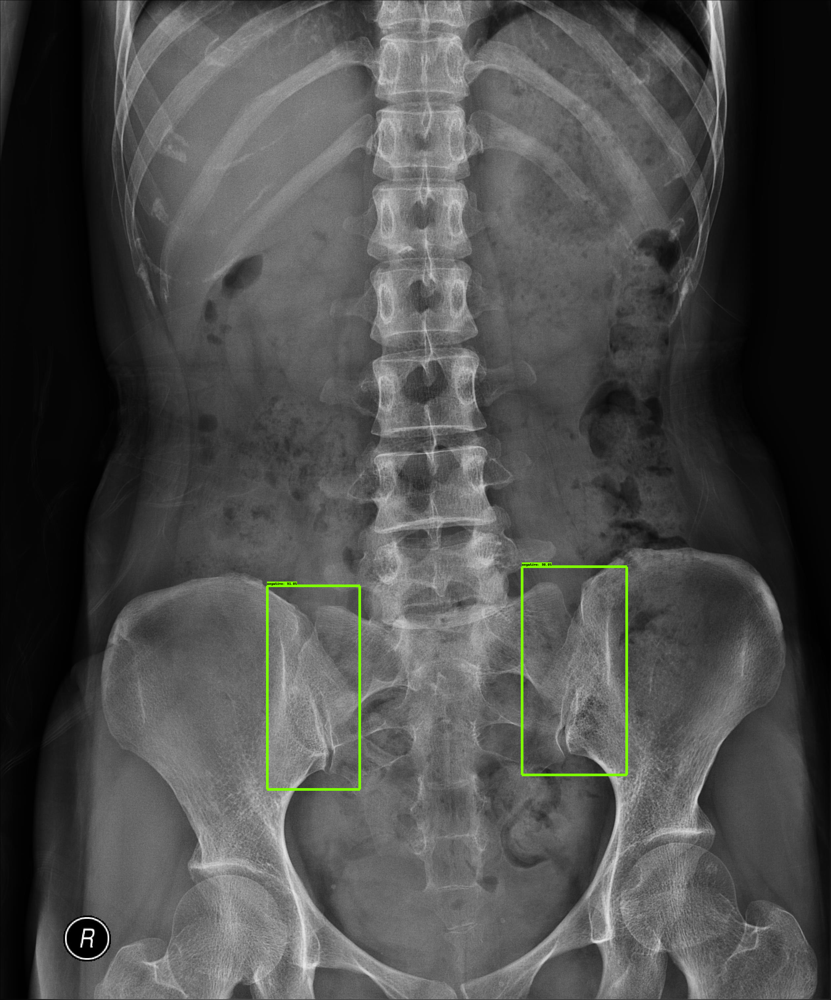

/home/user/TensorFlow/workspace/training_AS/images/test/10030968_128_0.jpg


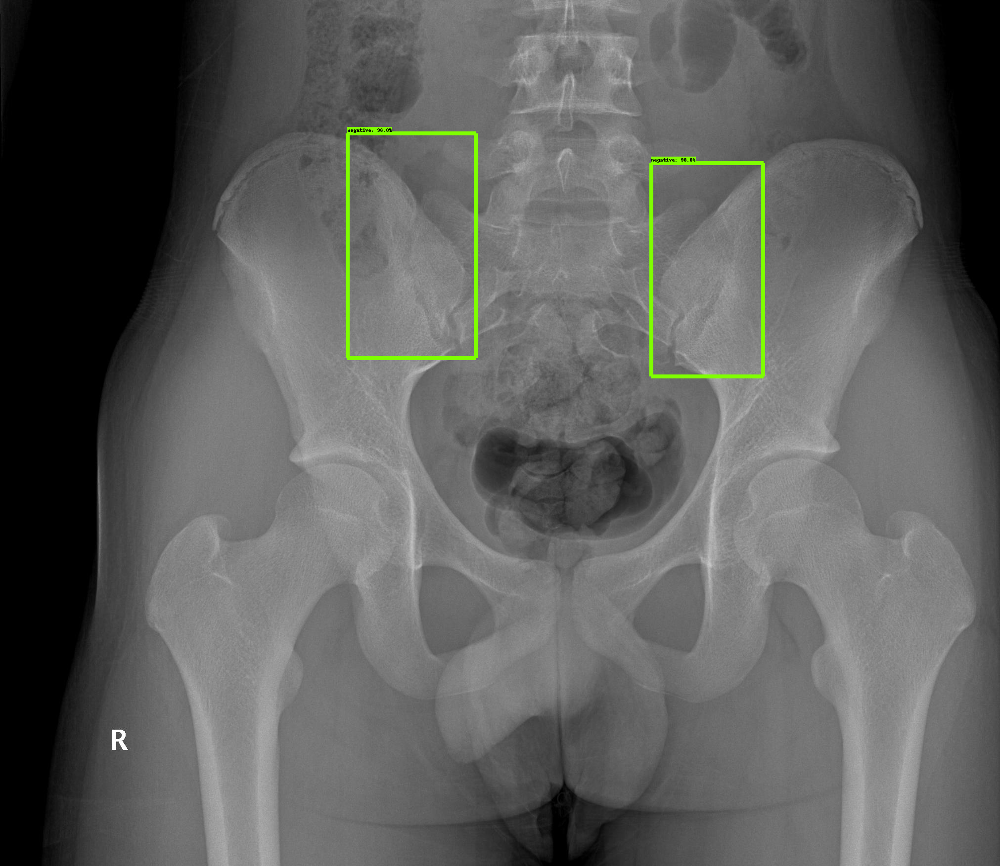

/home/user/TensorFlow/workspace/training_AS/images/test/10030968_129_0.jpg


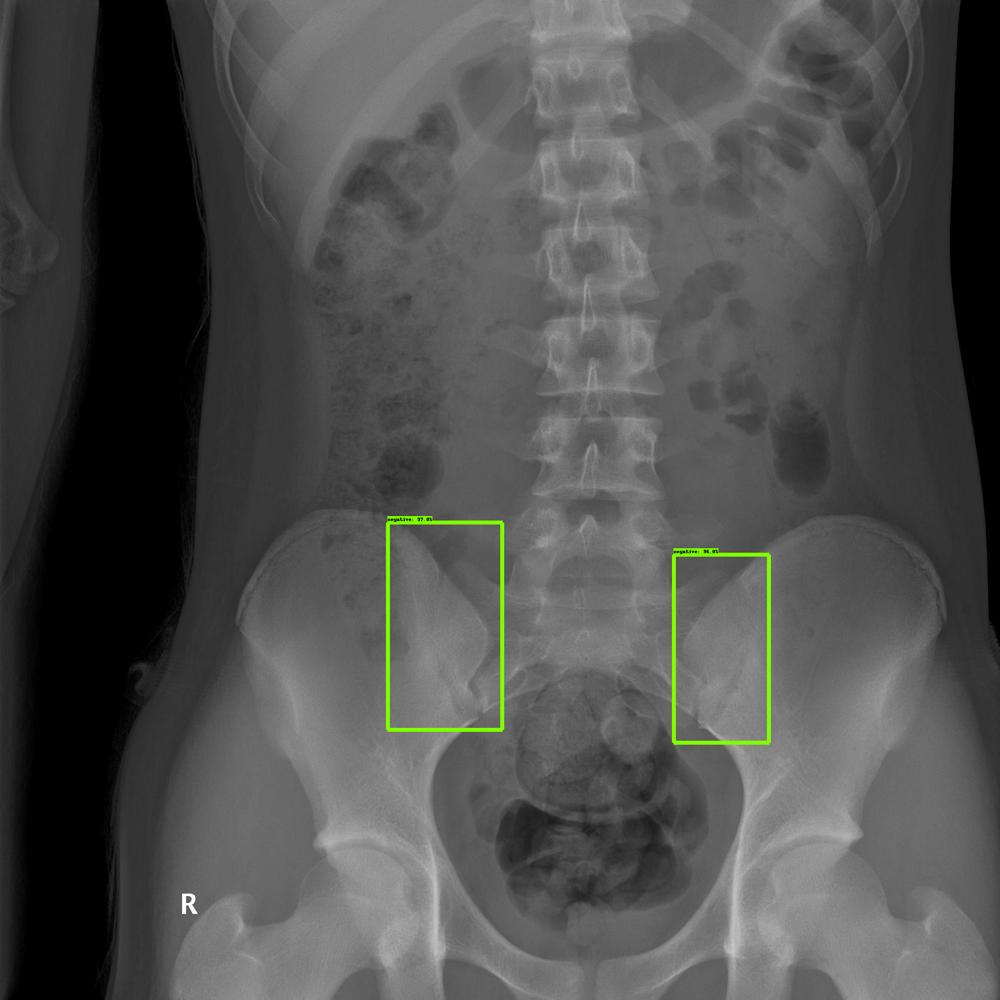

In [ ]:
prediction_lst = []
error_imgs = []
count = 0

for image_path in TEST_IMAGE_PATHS:
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = np.array(Image.open(image_path))
#    image_np = imutils.resize(image_np, width=1024)
    # Actual detection.
    try:
        print(image_path)
        output_dict = run_inference_for_single_image(detection_model, image_np)
#        print(output_dict['detection_scores'][:3], output_dict['detection_classes'][:3])
        # Visualization of the results of a detection.
        vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          output_dict['detection_boxes'],
          output_dict['detection_classes'],
          output_dict['detection_scores'],
          category_index,
          instance_masks=output_dict.get('detection_masks_reframed', None),
          use_normalized_coordinates=True,
          min_score_thresh=0.7,
          line_thickness=8)
        output_dict["filename"] = image_path
        prediction_lst.append(output_dict)
        display(Image.fromarray(image_np))
    except Exception as ex:
        count += 1
        error_imgs.append(image_path)
        print(image_path)
        print(ex)
print(count)

## Confusion Matrix

In [24]:
img_error_lst = [error_img.name for error_img in error_imgs]
img_error_lst

['10030016_22_0.jpg',
 '10452585_341_0.jpg',
 '10532290_2521_0.jpg',
 '10548394_3744_0.jpg',
 '10592704_532_0.jpg',
 '10608539_1615_0.jpg',
 '10638334_3338_0.jpg',
 '10655329_3668_0.jpg',
 '10663966_637_0.jpg',
 '10667887_3126_0.jpg',
 '10672058_3872_0.jpg',
 '10683119_2139_0.jpg',
 '10699619_2075_0.jpg',
 '10700258_2568_0.jpg',
 '10701041_691_0.jpg',
 '10708540_1732_0.jpg',
 '10722717_1809_0.jpg',
 '10739217_3664_0.jpg',
 '10740297_3098_0.jpg',
 '10741460_3443_0.jpg',
 '10745854_1777_0.jpg',
 '10768574_1742_0.jpg',
 '10768710_3614_0.jpg',
 '10772042_2261_0.jpg',
 '10776585_2395_0.jpg',
 '10799464_3242_0.jpg',
 '10807108_1693_0.jpg',
 '10846192_3415_0.jpg',
 '10868773_1618_0.jpg',
 '10876693_2445_0.jpg',
 '10895520_3692_0.jpg',
 '11234319_3759_0.jpg',
 '11234436_3896_0.jpg',
 '11260982_2716_0.jpg',
 '11267581_3693_0.jpg',
 '11278138_3784_0.jpg',
 '11281507_3099_0.jpg',
 '11309755_3719_0.jpg',
 '11321813_3519_0.jpg',
 '11322444_3259_0.jpg',
 '11330261_921_0.jpg',
 '11334624_3640_0.jpg',

In [25]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import collections
csvpath = "/home/user/TensorFlow/workspace/training_AS/images/test/test.csv"
csv = pd.read_csv(csvpath)
csv = csv.sort_values(by=["Filename", "BX"])
print(csv)
filename_lst = sorted(list(set(csv["Filename"].to_list())))
filename_lst

     Unnamed: 0      no       MRN             Filename       BX       BY  \
290           2     3.0  10007614    10007614_34_0.jpg   98.007  205.259   
291           3     4.0  10007614    10007614_34_0.jpg  203.410  208.403   
78         1112     NaN  10030016    10030016_18_0.jpg  127.500   71.400   
79         1113     NaN  10030016    10030016_18_0.jpg  233.580   65.280   
167        1114     NaN  10030016    10030016_19_0.jpg   83.640  223.720   
..          ...     ...       ...                  ...      ...      ...   
245         873  1086.0  11716568  11716568_2096_0.jpg  223.332  207.052   
48          874  1087.0  11718329  11718329_2144_0.jpg  113.220  188.700   
49          875  1088.0  11718329  11718329_2144_0.jpg  219.928  192.104   
283        1559     NaN  11729185  11729185_1061_0.jpg   72.280  219.064   
282        1106     NaN  11729185  11729185_1061_0.jpg  209.056  224.624   

      Width   Height   Scale label_patient  Grade label_SIJ  
290  52.887   92.829  5.4

['10007614_34_0.jpg',
 '10030016_18_0.jpg',
 '10030016_19_0.jpg',
 '10030016_22_0.jpg',
 '10030968_129_0.jpg',
 '10031690_133_0.jpg',
 '10067364_284_0.jpg',
 '10092085_61_0.jpg',
 '10102206_417_0.jpg',
 '10104656_67_0.jpg',
 '10123605_489_0.jpg',
 '10148670_549_0.jpg',
 '10166638_595_0.jpg',
 '10196179_138_0.jpg',
 '10218241_159_0.jpg',
 '10248686_181_0.jpg',
 '10256425_879_0.jpg',
 '10281966_952_0.jpg',
 '10305150_1022_0.jpg',
 '10312815_216_1.jpg',
 '10316980_1066_0.jpg',
 '10322685_222_0.jpg',
 '10322685_224_0.jpg',
 '10332207_230_0.jpg',
 '10353678_251_0.jpg',
 '10387374_1289_0.jpg',
 '10395684_1315_0.jpg',
 '10411473_1354_0.jpg',
 '10414607_295_0.jpg',
 '10414607_296_0.jpg',
 '10435820_1408_0.jpg',
 '10436920_322_0.jpg',
 '10440674_1424_0.jpg',
 '10449787_337_0.jpg',
 '10452585_341_0.jpg',
 '10453015_347_0.jpg',
 '10453015_348_0.jpg',
 '10453015_350_0.jpg',
 '10455947_357_0.jpg',
 '10455947_359_0.jpg',
 '10459831_363_0.jpg',
 '10460879_367_0.jpg',
 '10467671_377_0.jpg',
 '10467671

In [26]:
import numpy as np
true_y_col = csv["label_SIJ"].to_list()
true_y = []
for i, file in enumerate(filename_lst):
    if file in img_error_lst:
        continue
    label = [true_y_col[2*i],true_y_col[2*i+1]]
    true_y += label
true_y = np.array(true_y)
true_y[true_y=="negative"] = 1
true_y[true_y=="positive"] = 2
true_y = list(map(int, true_y))
print(true_y, len(true_y))

[1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1] 218


In [27]:
# get biggest prediction result
pred_y = []
score_dict = {}
for output_dict in prediction_lst[:]:
    detection_scores = output_dict["detection_scores"]
    detection_classes = output_dict["detection_classes"]
#    print(detection_classes[:6])
#    print(detection_scores[:6])
    detection_boxes = output_dict["detection_boxes"] #ymin, xmin, ymax, xmax
    filename = output_dict["filename"]
    position = ["right" if i[1] > 0.5 else "left" for i in detection_boxes]
#    print(position, position.index("right"), position.index("left"))
    pred_y += [detection_classes[position.index("right")],detection_classes[position.index("left")]]
    score_dict[filename] = (detection_scores[position.index("right")],detection_scores[position.index("left")])

print(pred_y)

[1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2]


              precision    recall  f1-score   support

           1       0.76      0.77      0.77        75
           2       0.88      0.87      0.88       143

    accuracy                           0.84       218
   macro avg       0.82      0.82      0.82       218
weighted avg       0.84      0.84      0.84       218



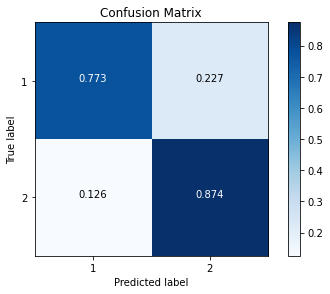

In [29]:
# evaluate classification results
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline
import itertools

cm = confusion_matrix(true_y, pred_y, normalize='true')
print(classification_report(true_y, pred_y))

classes = [1,2]
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=0)
plt.yticks(tick_marks, classes)

for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, round(cm[i, j], 3),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > cm.max()/2 else "black")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()



In [13]:
result = [1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2]
result[result==1] = "negative"
result[result==2] = "positive"
